<a href="https://www.kaggle.com/victorsenoguchi/g3-eda-chicago-taxi-trips?scriptVersionId=89949311" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

## Identification of all the members of the group.

Name: Luca Lopes Barcelos - 11221672

Name: Daniel Angelo Esteves Lawand - 10297693

Name: Thiago Gomes Veríssimo - 5385361 
 
Name: Luan Carlos da Silva Casagrande - 12630405

Name: Lucy Anne de Omena Evangelista - 11221776

Name: Victor Senoguchi Borges - 9298580

## Name of the dataset

Dataset: Chicago taxi trips

https://data.cityofchicago.org/Transportation/Taxi-Trips/wrvz-psew/data

https://www.kaggle.com/chicago/chicago-taxi-trips-bq


## Motivation to choose this dataset

Rational for choosing this dataset:

- Presença de dados geográficos
- O desafio de lidar copm um grande conjunto de dados
- Dados são atualizados diariamente
- Dados reais

## Abstract
Abstract of the dataset (describe the dataset with your own words):

É um conjunto de dados que contém dados de viagens de taxi da cidade de Chicago - EUA, desde 2013 até 2021 e contando. O conjunto de dados abrange diversas companhias de taxi e regiões da cidade.
As principais colunas que podemos destacar são: duração da viagem, quando ela foi realizada, distância percorrida, região censitária, companhia, valor da viagem, valor da gorjeta e tipo de pagamento. O conjunto de dados é atualizado todo primeiro dia do mês.

Ao longo da análise foram feitos diferentes recortes da base de dados. Também, utilizamos como guia para a análise questões levantadas em uma atividade de aula passada.

## Questions to the dataset

Questões simples:
- Períodos de maior demanda por dia?
- Velocidade média de viagem por período de tempo?
- A área coberta pelas companhias de taxi é diferente? Há regiões de monopólio?
- As pessoas costumam usar mais o táxi para viagens curtas ou longas? 

Questões não-obvias:

- A companhia de taxi influencia no valor da gorjeta? 
- A forma de pagamento influencia no valor da gorjeta? 
- Quais feriados têm a maior velocidade média de viagem? 
- Qual é a relação entre o custo total e o valor da gorjeta? 
- Há diferença do tempo médio de duração das viagens de acordo com o horário do dia (e/ou local)? (dia, tarde, noite)

## EDA
Present your EDA strategy:

### Imports

In [1]:
!pip install holidays

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import holidays
import copy

warnings.filterwarnings('ignore')

from google.cloud import bigquery

Importando o conjunto de dados:

In [3]:
# Inspirado em: https://www.kaggle.com/sergejnuss/chicago-taxi-tips-fares-crime
client = bigquery.Client()
dataset_ref = client.dataset("chicago_taxi_trips", project="bigquery-public-data")
table_ref = dataset_ref.table("taxi_trips")
table = client.get_table(table_ref)

Using Kaggle's public dataset BigQuery integration.


### Análise inicial

In [4]:
client.list_rows(table, max_results=5).to_dataframe()

,unique_key,taxi_id,trip_start_timestamp,trip_end_timestamp,trip_seconds,trip_miles,pickup_census_tract,dropoff_census_tract,pickup_community_area,dropoff_community_area,...,extras,trip_total,payment_type,company,pickup_latitude,pickup_longitude,pickup_location,dropoff_latitude,dropoff_longitude,dropoff_location
0,7f892ec7515bd913c549b6191d4f1210dab6bd48,51d13e9ec1a04be36d87a3746e0e4f8c68ca5ed59e6f7a...,2019-02-16 13:30:00+00:00,2019-02-16 14:15:00+00:00,2662,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Credit Card,City Service,NaN,NaN,None,NaN,NaN,None
1,3343feb9ec86b7583eda014b283a73607a9bac0c,6b6ceb851bc1c33fcad40360a39cdd774c3269b1a13464...,2019-02-22 17:30:00+00:00,2019-02-22 17:30:00+00:00,13,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,Cash,Chicago Carriage Cab Corp,NaN,NaN,None,NaN,NaN,None
2,61057274be2441292e556305abfaa5c43eace54a,664a30bd4642ae849cb593c18f9bf5f3def292f714d1b2...,2019-03-01 16:30:00+00:00,2019-03-01 16:30:00+00:00,72,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,Credit Card,City Service,NaN,NaN,None,NaN,NaN,None
3,f2e00f30b9575fc6e1eb18dded32b7ee3add2f56,664a30bd4642ae849cb593c18f9bf5f3def292f714d1b2...,2019-03-01 16:45:00+00:00,2019-03-01 16:45:00+00:00,31,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,Cash,City Service,NaN,NaN,None,NaN,NaN,None
4,4f027f16e2fba80ddf7504b4b1a19c1dc0a6113c,664a30bd4642ae849cb593c18f9bf5f3def292f714d1b2...,2019-03-01 16:45:00+00:00,2019-03-01 16:45:00+00:00,137,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,Cash,City Service,NaN,NaN,None,NaN,NaN,None


In [5]:
# qual a quantidade de linhas no dataset

query = """SELECT COUNT(*)
                  FROM `bigquery-public-data.chicago_taxi_trips.taxi_trips`"""

n = client.query(query).result().to_dataframe()
n

,f0_
0,199465637


In [6]:
query_aux = """SELECT * 
                FROM `bigquery-public-data.chicago_taxi_trips.taxi_trips`
                LIMIT 1"""
initial = client.query(query_aux).result().to_dataframe()
print(f"Colunas do conjunto de dados: \n{initial.columns}")

Colunas do conjunto de dados: 
Index(['unique_key', 'taxi_id', 'trip_start_timestamp', 'trip_end_timestamp',
       'trip_seconds', 'trip_miles', 'pickup_census_tract',
       'dropoff_census_tract', 'pickup_community_area',
       'dropoff_community_area', 'fare', 'tips', 'tolls', 'extras',
       'trip_total', 'payment_type', 'company', 'pickup_latitude',
       'pickup_longitude', 'pickup_location', 'dropoff_latitude',
       'dropoff_longitude', 'dropoff_location'],
      dtype='object')


In [7]:
# Início e fim do dataset

query = """SELECT MIN(trip_start_timestamp) AS inicio, MAX(trip_start_timestamp) AS fim 
                  FROM `bigquery-public-data.chicago_taxi_trips.taxi_trips`"""
periodo = client.query(query).result().to_dataframe()
periodo

,inicio,fim
0,2013-01-01 00:00:00+00:00,2022-03-01 00:00:00+00:00


********************

### Quais são os períodos de maior demanda por dia

Para essa análise limitamos a quantidade de linhas para tornar a consulta mais rapidamente.

In [8]:
query = """SELECT  trip_start_timestamp
                , pickup_community_area
                , company
           FROM `bigquery-public-data.chicago_taxi_trips.taxi_trips`
           WHERE pickup_community_area IS NOT NULL
           LIMIT 100000"""
df_trips = client.query(query).result().to_dataframe()

Neste momento transformamos a coluna como dado categórico para facilitar a manipulação na análise.

In [9]:
df_trips['trip_start_time'] = df_trips['trip_start_timestamp'].dt.time
df_trips['trip_start_time'] = df_trips['trip_start_time'].astype('category')

In [10]:
df_trips['trip_start_time']

0        18:30:00
1        12:00:00
2        16:00:00
3        10:15:00
4        12:30:00
           ...   
99995    19:15:00
99996    13:15:00
99997    20:45:00
99998    22:30:00
99999    01:15:00
Name: trip_start_time, Length: 100000, dtype: category
Categories (96, object): [00:00:00, 00:15:00, 00:30:00, 00:45:00, ..., 23:00:00, 23:15:00, 23:30:00, 23:45:00]

In [11]:
plt.rcParams.update({'figure.figsize':(12, 12), 'figure.dpi': 1080})
ay = sns.countplot(data = df_trips, y = 'trip_start_time', palette = 'colorblind')
ay.set(ylabel = 'Time')
ay.set_title("Histogram of trips counts per time slice")
plt.show()

In [12]:
df_trips['trip_start_hour'] = df_trips['trip_start_timestamp'].dt.hour

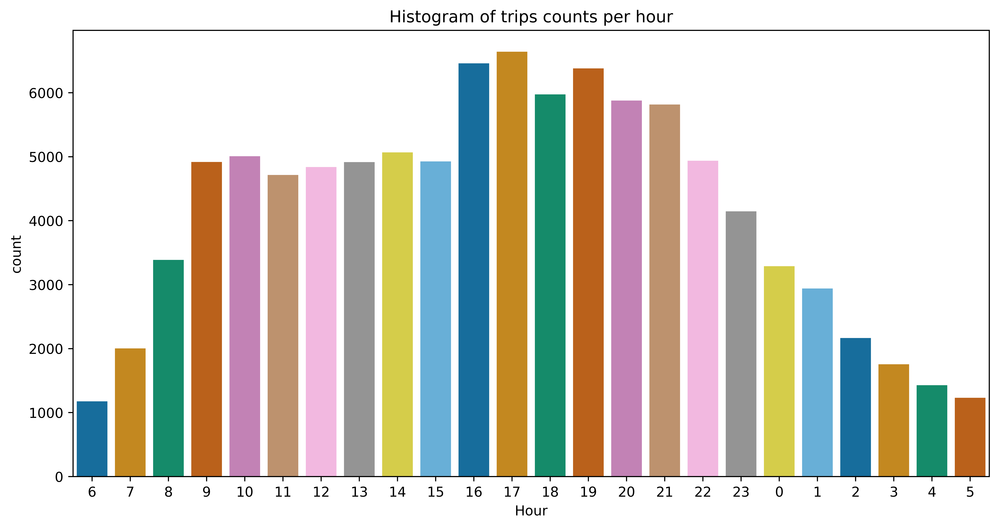

In [13]:
df_trips['trip_start_hour'] = df_trips['trip_start_timestamp'].dt.hour
df_trips['trip_start_hour'] = df_trips['trip_start_hour'].astype('category')

plt.rcParams.update({'figure.figsize':(12,6), 'figure.dpi': 720})
ax = sns.countplot(data = df_trips, x = 'trip_start_hour', palette = 'colorblind', 
                   order=[6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,0,1,2,3,4,5])
ax.set(xlabel= 'Hour')
ax.set(title= 'Histogram of trips counts per hour')
plt.show()

Podemos verificar, tanto no histograma com particionamento por hora quando por a cada quinze minutos que há um pico de viagens às 19hrs, sendo que podemos definir um horário de pico como sendo entre 18hrs e 21hrs. Há menos viagens entre às 3hrs e 7hrs da manhã.

Ao se observar o histograma começando às 6hrs da manhã até a 5hr da manhã podemos observar um formato de curva que se assemelha à normal. Também é interessante notar que há um único pico de corridas por dia.

### A área coberta pelas companhias de taxi é diferente? Há regiões de monopólio?

Começamos a análise observando a presença de corridas nas diferentes regiões

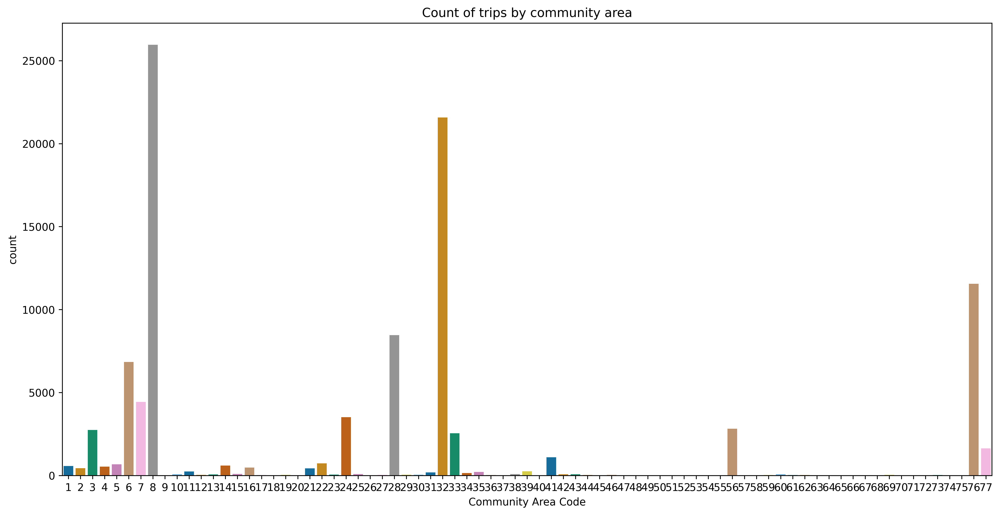

In [14]:
plt.rcParams.update({'figure.figsize':(16,8), 'figure.dpi': 480})
ax = sns.countplot(data = df_trips, x = 'pickup_community_area',
              palette = 'colorblind')
ax.set(xlabel = 'Community Area Code')
ax.set(title = 'Count of trips by community area')
plt.show()

Percebemos que há uma uma quantidade pequena de áreas comunitárias com maior quantidade de viagens. Vamos descobrir quais são essas áreas. Primeiro, nomeamos as áreas de acordo com as definições da cidade de Chicago* e fazemos uma contagem de viagens.


*https://www.chicago.gov/content/dam/city/depts/doit/general/GIS/Chicago_Maps/Citywide_Maps/Community_Areas_W_Numbers.pdf

In [15]:
community_area_name = {1: 'Rogers Park', 2: 'West Ridge', 3: 'Uptown', 4: 'Lincoln Square',
                       5: 'North Center', 6: 'Lake View', 7: 'Lincoln Park', 8: 'Near North Side',
                       9: 'Edison Park', 10: 'Norwood Park', 11: 'Jeffesron Park', 12: 'Forest Glen',
                       13: 'North Park', 14: 'Albany Park', 15: 'Portage Park', 16: 'Irving Park',
                       17: 'Dunning', 18: 'Montclare', 19: 'Belmont Cragin', 20: 'Hermosa',
                       21: 'Avondale', 22: 'Logan Square', 23: 'Humboltd Park', 24: 'West Town',
                       25: 'Austin', 26: 'West Garfield Park', 27: 'East Garfield Park',
                       28: 'Near West Side', 29: 'North Lawndale', 30: 'South Lawndale',
                       31: 'Lower West Side', 32: 'Loop', 33: 'Near South Side', 
                       34: 'Armour Square', 35: 'Douglas', 36: 'Oakland', 37: 'Fuller Park',
                       38: 'Grand Boulevard', 39: 'Kenwood', 40: 'Washington Park', 41: 'Hyde Park',
                       42: 'Woodlawn', 43: 'South Shore', 44: 'Chatham', 45: 'Avalon Park',
                       46: 'South Chicago', 47: 'Burnside', 48: 'Calumet Heights', 49: 'Roseland',
                       50: 'Pullman', 51: 'South Deering', 52: 'East Side', 53: 'West Pullman',
                       54: 'Riverdale', 55: 'Hegewisch', 56: 'Garfield Ridge', 57: 'Archer Heights',
                       58: 'Brighton Park', 59: 'McKinley Park', 60: 'Bridgeport', 61: 'New City',
                       62: 'West Elsdon', 63: 'Gage Park', 64: 'Clearing', 65: 'West Lawn',
                       66: 'Chicago Lawn', 67: 'West Englewood', 68: 'Englewood',
                       69: 'Greater Grand Crossing', 70: 'Ashburn', 71: 'Auburn Gresham', 
                       72: 'Beverly', 73: 'Washington Heights', 74: 'Mount Greenwood',
                       75: 'Morgan Park', 76: 'O\'Hare', 77: 'Edgewater'}

In [16]:
df_trips['community_area'] = df_trips['pickup_community_area'].apply(lambda x: community_area_name[x])
df_trips['community_area'] 

0        Hyde Park
1           Uptown
2         Burnside
3         Burnside
4         Burnside
           ...    
99995    West Town
99996    West Town
99997    West Town
99998    West Town
99999    West Town
Name: community_area, Length: 100000, dtype: object

In [17]:
print("\n\t10 community areas with more trips\n")
community_area_counts = df_trips['community_area'].value_counts()
community_area_counts = community_area_counts.sort_values(ascending = False)
community_area_counts[:10]


	10 community areas with more trips



Near North Side    25961
Loop               21573
O'Hare             11553
Near West Side      8455
Lake View           6844
Lincoln Park        4434
West Town           3516
Garfield Ridge      2814
Uptown              2740
Near South Side     2548
Name: community_area, dtype: int64

Também verificamos como é a distribuição de viagens por companhias

In [18]:
print("\n\t10 companies with more trips\n")
company_counts = df_trips['company'].value_counts()
company_counts = company_counts.sort_values(ascending = False)
company_counts[:10]


	10 companies with more trips



Taxi Affiliation Services                   52729
Dispatch Taxi Affiliation                   14192
Blue Ribbon Taxi Association Inc.           10566
Choice Taxi Association                      8545
Northwest Management LLC                     4895
KOAM Taxi Association                        2877
Top Cab Affiliation                          1943
Chicago Medallion Leasing INC                 733
Chicago Medallion Management                  368
Chicago Elite Cab Corp. (Chicago Carriag      356
Name: company, dtype: int64

Agora verificamos quantas corridas estão presentes tanto das maiores áreas comunitárias quanto são feitas pelas companhias mais populares.

In [19]:
filtered_df = df_trips[df_trips['community_area'].isin(community_area_counts[:10].index) &
                       df_trips['company'].isin(company_counts[0:10].index)]
filtered_df.head()

,trip_start_timestamp,pickup_community_area,company,trip_start_time,trip_start_hour,community_area
7,2015-10-20 17:45:00+00:00,33,Chicago Medallion Management,17:45:00,17,Near South Side
8,2015-10-10 22:15:00+00:00,8,Chicago Medallion Management,22:15:00,22,Near North Side
17,2015-10-25 04:30:00+00:00,8,Chicago Medallion Management,04:30:00,4,Near North Side
19,2015-11-14 20:30:00+00:00,8,Chicago Medallion Management,20:30:00,20,Near North Side
22,2015-10-20 19:00:00+00:00,28,Chicago Medallion Management,19:00:00,19,Near West Side


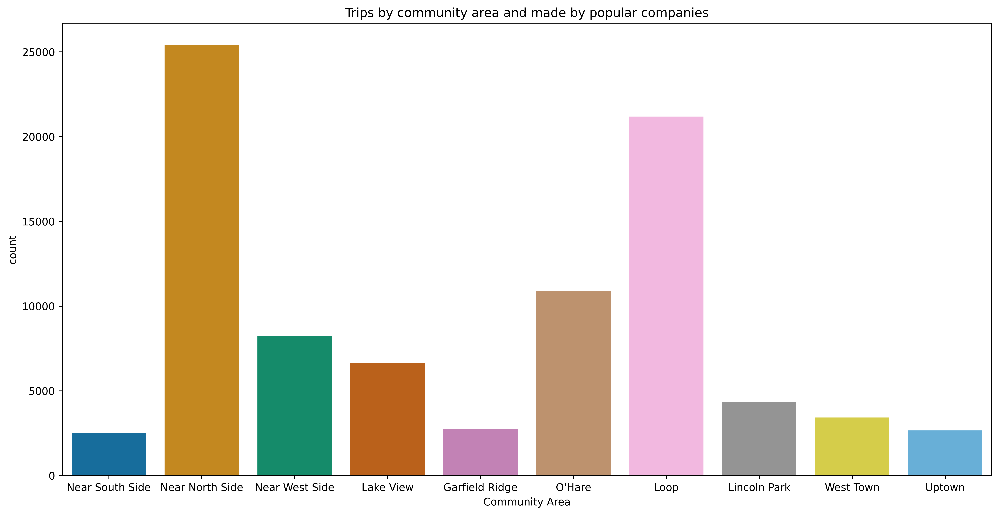

In [20]:
plt.rcParams.update({'figure.figsize':(16,8), 'figure.dpi': 480})
ax = sns.countplot(data = filtered_df, x = 'community_area',
                   palette = 'colorblind')
ax.set(xlabel = 'Community Area')
ax.set_title("Trips by community area and made by popular companies")
plt.show()

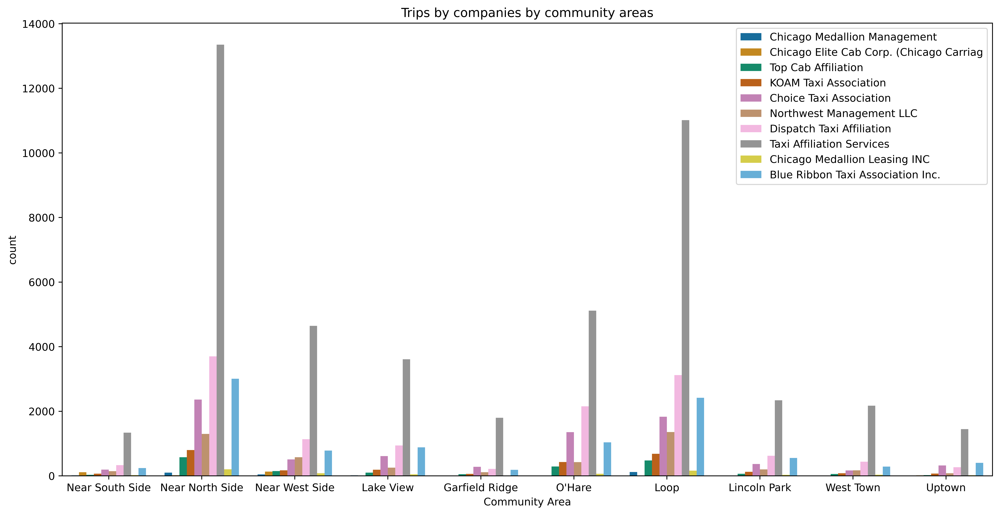

In [21]:
plt.rcParams.update({'figure.figsize':(16,8), 'figure.dpi': 720})
ax = sns.countplot(data = filtered_df, x = 'community_area',
              palette = 'colorblind', hue = 'company')
ax.set(xlabel = 'Community Area')
ax.legend(loc='upper right')
ax.set_title("Trips by companies by community areas")
plt.show()

A partir da análise descobrimos que há uma empresa que possui mais viagens em todas as regiões com mais viagens. Essa companhia é a `Taxi Affiliation Services`.

### Qual é a velocidade média de viagem por período de tempo?

Para essa análise selecionamos dados de viagens com as marcação de hora, mês, e mês e hora, transformando as unidades em kilometro e hora. Também queremos saber como ocorre a variação de velocidade entre os meses. A base de dados utilizada é de todos os meses já registrados.

In [22]:
query_data = """SELECT 
                    DATE_TRUNC(trip_start_timestamp, MONTH) as month_t
                  , EXTRACT(month FROM trip_start_timestamp) as month
                  , DATE_TRUNC(trip_start_timestamp, HOUR) as month_hour
                  , EXTRACT(HOUR FROM trip_start_timestamp) as hour
                  , SUM(trip_miles*1.61) as trip_km
                  , SUM(trip_seconds/3600) as trip_hours 
                  FROM `bigquery-public-data.chicago_taxi_trips.taxi_trips`
                  WHERE trip_seconds > 0
                    -- and DATE_TRUNC(trip_start_timestamp, MONTH) > DATE_TRUNC(DATE"2018-01-01", MONTH) 
                  GROUP BY 1,2,3,4 """
q2 = client.query(query_data).result().to_dataframe()

print(f"Há {len(q2)} entradas agrupadas para dados de velocidade em toda a base")

Há 80296 entradas agrupadas para dados de velocidade em toda a base


Adicionando coluna com a velocidade

In [23]:
q2["mean_velocity"] = q2["trip_km"]/q2["trip_hours"]
q2.head()

,month_t,month,month_hour,hour,trip_km,trip_hours,mean_velocity
0,2022-03-01 00:00:00+00:00,3,2022-03-01 00:00:00+00:00,0,222.1156,6.723611,33.035165
1,2022-02-01 00:00:00+00:00,2,2022-02-01 00:00:00+00:00,0,1446.3918,33.838889,42.743478
2,2022-02-01 00:00:00+00:00,2,2022-02-18 14:00:00+00:00,14,9139.6319,337.265000,27.099260
3,2022-02-01 00:00:00+00:00,2,2022-02-27 01:00:00+00:00,1,2616.4110,116.045556,22.546413
4,2022-02-01 00:00:00+00:00,2,2022-02-07 19:00:00+00:00,19,7349.3924,223.598333,32.868726


Análise de velocidade por hora

In [24]:
hour_df = pd.DataFrame(q2.groupby("hour")["mean_velocity"].mean())
hour_df.reset_index(inplace=True)

hour_df['hour'] = hour_df['hour'].astype('category')

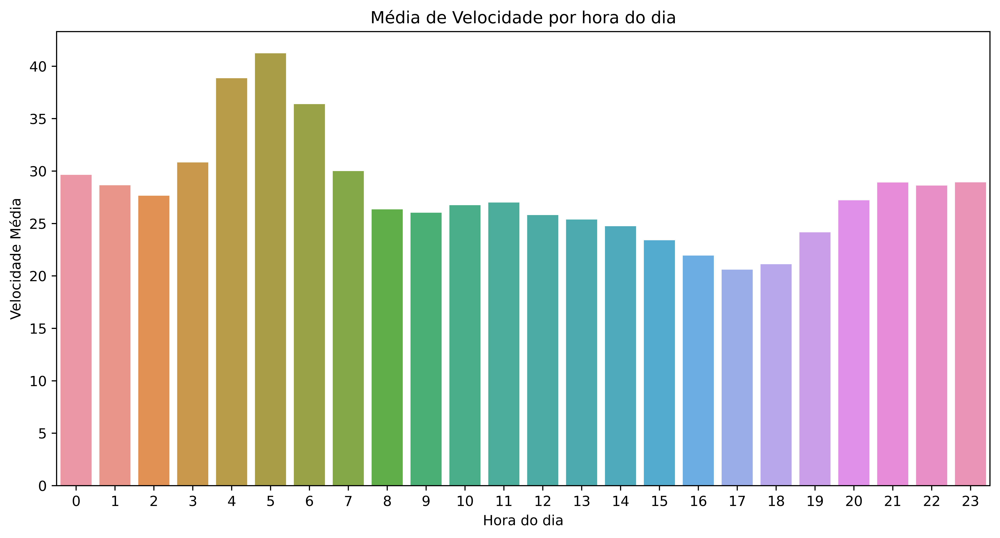

In [25]:
plt.rcParams.update({'figure.figsize':(12,6), 'figure.dpi': 720})
ax = sns.barplot(data = hour_df, x = 'hour', y = 'mean_velocity')
ax.set(xlabel= 'Hora do dia')
ax.set(ylabel= 'Velocidade Média')
ax.set(title= 'Média de Velocidade por hora do dia')
plt.show()

In [26]:
# Data frame que recebe a média de velocidade de cada mês
month_df = pd.DataFrame(q2.groupby("month")["mean_velocity"].mean())
month_df.reset_index(inplace=True)
month_df.head()

month_df['month'] = month_df['month'].astype('category')

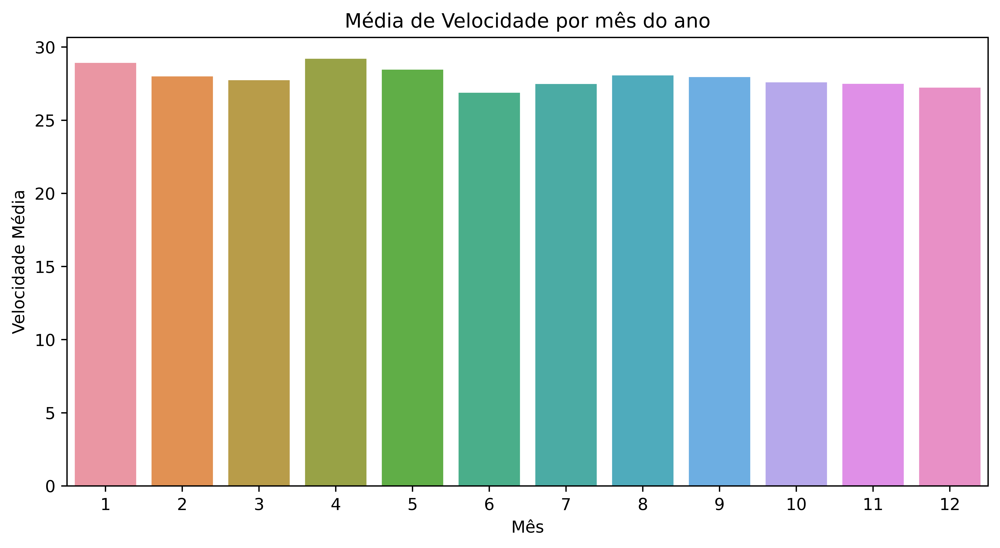

In [27]:
plt.rcParams.update({'figure.figsize':(10,5), 'figure.dpi': 720})
ax = sns.barplot(data = month_df, x = 'month', y = 'mean_velocity')
ax.set(xlabel= 'Mês')
ax.set(ylabel= 'Velocidade Média')
ax.set(title= 'Média de Velocidade por mês do ano')
plt.show()

Agora fazendo a mesma análise para o cruzamento de mês e hora de cada ano

In [28]:
month_hour_df = pd.DataFrame(q2.groupby(["month","hour"])["mean_velocity"].mean())
month_hour_df.reset_index(inplace=True)

# coluna para a categoria mes + hora
month_hour_df["month_hour"] = month_hour_df.month.map(str) + ' - ' + month_hour_df.hour.map(str)+ 'hrs'

month_hour_df['month_hour'] = month_hour_df['month_hour'].astype('category')
month_hour_df.head()

,month,hour,mean_velocity,month_hour
0,1,0,30.571780,1 - 0hrs
1,1,1,29.028188,1 - 1hrs
2,1,2,27.434252,1 - 2hrs
3,1,3,30.133819,1 - 3hrs
4,1,4,36.767883,1 - 4hrs


In [29]:
fig, ax = plt.subplots(figsize = (40,6))
plt.bar(month_hour_df['month_hour'],month_hour_df.mean_velocity)

ax.set_title("Média de Velocidade por mês e hora do ano")
ax.set_xlabel("Mês")
ax.set_ylabel("Velocidade Média")
plt.xticks(rotation=90)

plt.grid() 
plt.show()

In [30]:
print(f"\nA velocidade média das corridas é de {month_hour_df.mean_velocity.mean()}")


A velocidade média das corridas é de 27.9150850563396


Conseguimos verificar um padrão na velocidade das horas dos dias de cada mês. Ao mesmo tempo, conseguimos verificar que o mês 4 possui uma velocidade média pouco maior do que outros meses na madrugada. Com isso, há algum mês onde há uma diferença considerável na média de velocidade por hora? É possível verificar uma diferença de velocidade em relação á média desses dias?

Observamos então a diferença percentual de cada velocidade em relação à média total da base de dados

In [31]:
month_hour_df['mean'] = month_hour_df.mean_velocity.mean()
month_hour_df['mean_difference'] = month_hour_df['mean_velocity'] - month_hour_df['mean']
month_hour_df['mean_difference_percentual'] = month_hour_df['mean_difference']/month_hour_df['mean']
month_hour_df.head()

,month,hour,mean_velocity,month_hour,mean,mean_difference,mean_difference_percentual
0,1,0,30.571780,1 - 0hrs,27.915085,2.656695,0.095171
1,1,1,29.028188,1 - 1hrs,27.915085,1.113103,0.039875
2,1,2,27.434252,1 - 2hrs,27.915085,-0.480833,-0.017225
3,1,3,30.133819,1 - 3hrs,27.915085,2.218734,0.079482
4,1,4,36.767883,1 - 4hrs,27.915085,8.852798,0.317133


In [32]:
fig, ax = plt.subplots(figsize = (40,6))
plt.bar(month_hour_df['month_hour'],month_hour_df.mean_difference_percentual)

ax.set_title("Variação da velocidade por mês e hora em relação à média diária de velocidade")
ax.set_xlabel("Mês e hora")
ax.set_ylabel("Velocidade Média")
plt.xticks(rotation=90)

plt.grid() 
plt.show()

É interessante observar a diferença percentual em relação à média. Percebemos que tem meses em que a variação na velocidade é muito menor do que a média (chegando à mais do que 20%), em especial os meses de dezembro e junho. Talvez a presença de período de festas(dezembro) e de férias (junho), mas precisa ser investigado mais a fundo.

De toda forma, percebemos que não é muito eficiente analisar os dados dessa forma pois há uma diferença natural das diferenças dos horários entre si. Desssa forma, fazemos a mesma visualização com esse objetivo.
Iniciamos com um dataframe auxiliar para armazenar as médias de velocidade por hora no conjunto de dados.

In [33]:
df_aux = pd.DataFrame(month_hour_df.groupby("hour")["mean_velocity"].mean())
df_aux.reset_index(inplace=True)
df_aux.columns = ['hour', 'mean_hour']
df_aux

,hour,mean_hour
0,0,29.630868
1,1,28.638889
2,2,27.652748
3,3,30.836479
4,4,38.884955
5,5,41.251481
6,6,36.385824
7,7,29.990917
8,8,26.349851
9,9,26.039220


In [34]:
month_hour_df = pd.merge(month_hour_df, df_aux,how='left', left_on='hour', right_on='hour')
month_hour_df['mean_hour_difference'] = month_hour_df['mean_velocity'] - month_hour_df['mean_hour']
month_hour_df['mean_hour_difference_percentual'] = month_hour_df['mean_hour_difference']/month_hour_df['mean_hour']
month_hour_df.head()

,month,hour,mean_velocity,month_hour,mean,mean_difference,mean_difference_percentual,mean_hour,mean_hour_difference,mean_hour_difference_percentual
0,1,0,30.571780,1 - 0hrs,27.915085,2.656695,0.095171,29.630868,0.940912,0.031754
1,1,1,29.028188,1 - 1hrs,27.915085,1.113103,0.039875,28.638889,0.389299,0.013593
2,1,2,27.434252,1 - 2hrs,27.915085,-0.480833,-0.017225,27.652748,-0.218496,-0.007901
3,1,3,30.133819,1 - 3hrs,27.915085,2.218734,0.079482,30.836479,-0.702661,-0.022787
4,1,4,36.767883,1 - 4hrs,27.915085,8.852798,0.317133,38.884955,-2.117072,-0.054445


In [35]:
month_hour_difference_df = pd.DataFrame(month_hour_df.groupby(["month","hour"])["mean_hour_difference"].mean())

month_hour_difference_df.reset_index(inplace=True)

month_hour_difference_df["month_hour"] = month_hour_difference_df.month.map(str) + ' - ' + month_hour_difference_df.hour.map(str)+ 'hrs'
month_hour_difference_df['month_hour'] = month_hour_difference_df['month_hour'].astype('category')
month_hour_difference_df['mean_hour_difference_percentual'] = month_hour_df['mean_hour_difference']/month_hour_df['mean_hour']
month_hour_difference_df.head()


,month,hour,mean_hour_difference,month_hour,mean_hour_difference_percentual
0,1,0,0.940912,1 - 0hrs,0.031754
1,1,1,0.389299,1 - 1hrs,0.013593
2,1,2,-0.218496,1 - 2hrs,-0.007901
3,1,3,-0.702661,1 - 3hrs,-0.022787
4,1,4,-2.117072,1 - 4hrs,-0.054445


In [36]:
fig, ax = plt.subplots(figsize = (40,6))
plt.bar(month_hour_difference_df['month_hour'],month_hour_difference_df.mean_hour_difference_percentual)

ax.set_title("Variação percentual da velocidade por mês e hora em relação à média diária de velocidade")
ax.set_xlabel("Mês e hora")
ax.set_ylabel("Velocidade Média")
plt.xticks(rotation=90)

plt.grid() 
plt.show()

Observando o gráfico acima conseguimos verificar como as horas variam entre si. Com isso, verirficamos que os meses de outubro, novembro e dezembro tem redução na sua velocidade média e janeiro, março e abril possuem variação positiva da velocidade por hora em relação às médias das velocidades por hora.

*****************

### Quais feriados têm a maior velocidade média de viagem?

In [37]:
# todos os feriados dos EUA de 2017 até 2021
us_holidays = holidays.UnitedStates()
holidays = []
yi = 2017
yf = 2021
for year in range(yi,yf):
    fromDate = str(year)+'-01-01'
    toDate = str(year)+'-12-31'
    holidays.extend(us_holidays[fromDate:toDate])

copyHolidays = copy.deepcopy(holidays)
for holiday in copyHolidays:
    if('Observed' in us_holidays.get(holiday)):
        holidays.remove(holiday)

In [38]:
# condições para selecionar dados somente dos feriados
SQLConditions = '('
for posHoliday in range(len(holidays)):
    holiday = holidays[posHoliday]
    if(posHoliday == len(holidays)-1):
        SQLConditions += '(EXTRACT(MONTH from trip_start_timestamp) = ' + str(holiday.month) + '  and EXTRACT(DAY from trip_start_timestamp) = ' + str(holiday.day) + ')'
    else:
        SQLConditions += '(EXTRACT(MONTH from trip_start_timestamp) = ' + str(holiday.month) + '  and EXTRACT(DAY from trip_start_timestamp) = ' + str(holiday.day) + ') or '
SQLConditions += ')'

Capturando dados dos feriados

In [39]:
query = """SELECT trip_start_timestamp, trip_miles, trip_seconds, trip_miles/(trip_seconds/3600.0) as speed
                  FROM `bigquery-public-data.chicago_taxi_trips.taxi_trips`
                  WHERE trip_start_timestamp > '2017-01-01 12:00:00'  and trip_seconds > 0
                  and trip_miles > 0 
                  """
query += 'and ' + SQLConditions
query 
periodo = client.query(query).result().to_dataframe()

Selected all records from holidays between 2016 and 2020.

In [40]:
periodo['pickup_datetime']=pd.to_datetime(periodo['trip_start_timestamp'])
periodo['pickup_day_no']=periodo['pickup_datetime'].dt.weekday
periodo['pickup_day']=periodo['pickup_datetime'].dt.day
periodo['pickup_month']=periodo['pickup_datetime'].dt.month
periodo['pickup_year']=periodo['pickup_datetime'].dt.year

In [41]:
periodAux = copy.deepcopy(periodo)

Há dados com valores não esperados, como por exemplo velocidades acima de 9000mph.
Foi feita uma breve análise onde se decidiu remover velocidades acima de 55mph + 20% de erro.

Considerando que existe uma distribuição uniforme dos dados foi selecionado valor médio +/- 2 desvios padrões visando a remoção de outliers. 

In [42]:
speeds = periodAux['speed']
#max speed 55 mph, so let's filter by it plus 20% error
maxSpeed = 55
avrSpeed = np.average(speeds[speeds<maxSpeed*1.2])
std = np.std(speeds[speeds<maxSpeed*1.2])
periodo = periodAux[np.bitwise_and(periodAux['speed'] >= avrSpeed - 2*std, periodAux['speed'] <= avrSpeed + 2*std)]
data = {}

for holiday in holidays:
    key = us_holidays.get(holiday)
    df = periodo[np.bitwise_and(np.bitwise_and(periodo['pickup_day'] == holiday.day, 
                                                            periodo['pickup_month'] == holiday.month),
                                                            periodo['pickup_year'] == holiday.year)]
    if(key in data):
        data[key] = data[key].append(df)
    else:
        data[key] = df

In [43]:
print("Average speed (mph) per holiday. \n")

for key in data.keys():
    speed = data[key]['speed']
    avr_speed = np.average(data[key]['speed'])
    print(key, avr_speed)

Average speed (mph) per holiday. 

New Year's Day 14.340482829925234
Martin Luther King Jr. Day 14.579877379679878
Washington's Birthday 14.374923066377963
Memorial Day 15.521454838756478
Independence Day 13.732671166793276
Labor Day 15.526569448481053
Columbus Day 13.9069014277514
Veterans Day 13.54102663435132
Thanksgiving 15.043923973213666
Christmas Day 16.02951799458751


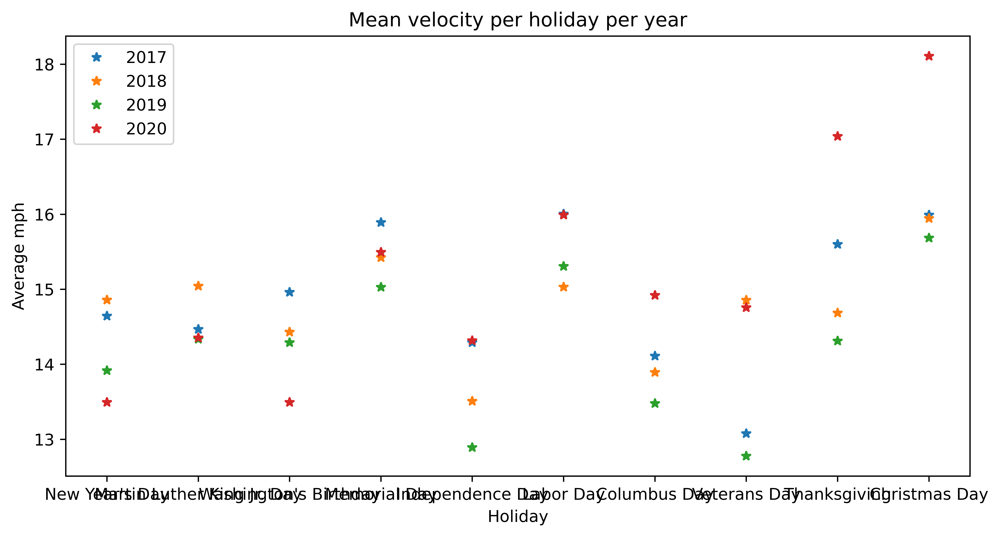

In [44]:
dataPerYear = {}
for holiday in holidays:
    key = us_holidays.get(holiday)
    dataPerYear[us_holidays.get(holiday), holiday.year] = periodo[np.bitwise_and(np.bitwise_and(periodo['pickup_day'] == holiday.day, 
                                                            periodo['pickup_month'] == holiday.month),
                                                            periodo['pickup_year'] == holiday.year)]

keys = data.keys()
for year in range(yi, yf):
    aux = [] 
    for keyHoliday in keys:
        if((keyHoliday, year) in dataPerYear):
            aux.append(np.average(dataPerYear[keyHoliday, year]['speed']))
        else:
            aux.append(None)
    plt.plot(keys, aux, '*', label=str(year))
plt.ylabel('Average mph')
plt.xlabel('Holiday')
plt.title('Mean velocity per holiday per year')
plt.legend()
plt.rcParams["figure.figsize"] = (30,10)

We can see a considerable distribution. It is important to note that some holidays are flexible, that is, they happen in a specific date instead of a specific day number. Such condition helps to cause such deviation, since average speed is much higher on sundays, for example. Such condition is demonstrated below.

In [45]:
query = """SELECT trip_start_timestamp, trip_miles, trip_seconds, trip_miles/(trip_seconds/3600.0) as speed
                  FROM `bigquery-public-data.chicago_taxi_trips.taxi_trips`
                  WHERE trip_start_timestamp > '2016-01-01 12:00:00' and trip_start_timestamp < '2021-01-01 00:00:00'  and trip_seconds > 0
                  and trip_miles > 0 
                  ORDER BY RAND()
                  LIMIT 50000
                  """
periodo_full = client.query(query).result().to_dataframe()

Data from some period. But, instead of all records, records were randomized and a specific amount was collected.

In [46]:
periodo_full['pickup_datetime']=pd.to_datetime(periodo_full['trip_start_timestamp'])
periodo_full['pickup_day_no']=periodo_full['pickup_datetime'].dt.weekday
periodo_full['pickup_day']=periodo_full['pickup_datetime'].dt.day
periodo_full['pickup_month']=periodo_full['pickup_datetime'].dt.month
periodo_full['pickup_year']=periodo_full['pickup_datetime'].dt.year

In [47]:
periodoFullAux = copy.deepcopy(periodo_full)

Assim como na parte anterior, filtramos dados discrepantes.

In [48]:
speeds = periodoFullAux['speed']
#max speed 55 mph, so let's filter by it plus 20% error
maxSpeed = 55
avrSpeed = np.average(speeds[speeds<maxSpeed*1.2])
std = np.std(speeds[speeds<maxSpeed*1.2])
periodo_full = periodoFullAux[np.bitwise_and(periodoFullAux['speed'] >= avrSpeed - 2*std, periodoFullAux['speed'] <= avrSpeed + 2*std)]

In [49]:
out = periodo_full.groupby(['pickup_year', 'pickup_day_no'])['speed'].mean()
for year in range(yi, yf):
    df = periodo_full[periodo_full['pickup_year']==year]
    df = df.groupby(['pickup_day_no'])['speed'].mean()
    plt.plot(df, label=str(year))
plt.ylabel('average mph')
plt.xlabel('Weekday number')
plt.title('Mean velocity by day of week')
plt.legend()
plt.show()

As described, sunday has a mich higher average speed value. That is expected, since it is a non-working day for a considerable percentage of population.

In [50]:
new_df = out.to_frame(name = 'mean').reset_index()
percentualDifference = {}

for holiday in holidays:
    avr_value = new_df[np.bitwise_and(new_df['pickup_year']==holiday.year, new_df['pickup_day_no']==holiday.weekday())]['mean'].item()
    avr_holiday_value = np.average(dataPerYear[us_holidays.get(holiday), year]['speed'])
    percentage_dif = (avr_holiday_value-avr_value)/avr_value
    if(us_holidays.get(holiday) not in percentualDifference):
        percentualDifference[us_holidays.get(holiday)] = [percentage_dif]
    else:
        percentualDifference[us_holidays.get(holiday)].append(percentage_dif)
keys = []

for key in percentualDifference.keys():
    percentualDifference[key] = np.average(percentualDifference[key])
plt.plot(*zip(*sorted(percentualDifference.items())), '*')
plt.title("Percentual difference of velocity per holiday")
plt.ylabel("Percentual difference")
plt.show()

This graph aggregates information from whole period analyzed taking into account average traffic per weekday. That is, we calculated percentual difference taking into account the weekday and used average value to demonstrate how faster/slower is each holiday. So, based on this graph, we can easily conclude that average taxi speed for Christimans day and Thanksgiving are much higher. This result was expected since these are the main holidays. However, an interesting fact is that New Year's day can be considered a normal day. So, we can suggest that people from Chicago don't celabrate this day.

### Questões sobre valor da gorjeta

- A compania influencia no valor da gorjeta?
- A forma de pagamento influencia no valor da gorjeta?
- Qual a relação entre custo total e o valor da gorjeta?


#### Qual a relação entre custo total e o valor da gorjeta?

In [51]:
# Quantidade total de viagens que possuem gorjeta

query = """SELECT count(*)
                  FROM `bigquery-public-data.chicago_taxi_trips.taxi_trips`
                  WHERE tips > 0
                  """
client.query(query).result().to_dataframe()

,f0_
0,76952595


Primeiro fazemos uma query onde selecionamos aleatóriamente 10000 linhas do nosso banco de dados, de forma a pegar uma amostra, já que temos um total de 76 milhões de corridas onde foi dado uma gorjeta, quantidade que dificultaria a visualização gráfica que gostaríamos.

In [52]:
query = """SELECT tips, fare 
            FROM `bigquery-public-data.chicago_taxi_trips.taxi_trips` 
            WHERE tips > 0 
            ORDER BY RAND() 
            LIMIT 10000
                  """
client.query(query).result().to_dataframe()
df = client.query(query).result().to_dataframe()

In [53]:
fig, ax = plt.subplots(2, 1)
fig.set_size_inches(18, 15)
sns.regplot(x = "fare", y="tips", data=df, scatter_kws={"alpha": 0.2}, ax=ax[0]).set_title('Tips distribution in relation to fare')

sns.regplot(x = "fare", y="tips", data=df, scatter_kws={"alpha": 0.2}, ax=ax[1]).set_title('Tips distribution in relation to fare')
ax[1].set_ylim([0,25])
ax[1].set_xlim([0,100])

(0.0, 100.0)



A primeira figura mostra todos os dados da nossa amostra de 10000 unidades, já a segunda figura da um zoom na área onde a maioria das corridas se encontra, para visualizarmos melhor a relação entre as variáveis.

Podemos observar uma correlação linear positiva entre o valor da corrida e o valor da gorjeta, ou seja, estatisticamente falando, podemos dizer que quanto maior o valor da corrida, maior o valor da gorjeta.


In [54]:
df["fare"].corr(df["tips"])

0.8302713950574576

A afirmação acima é confirmada pelo alto coeficiente de correlação entre as 2 variáveis, que no caso do nosso sample, é ~0,82. Continuamos nossa análise

In [55]:
# Qual a relação entre custo total e o valor da gorjeta?

query = """SELECT AVG(tips/trip_total) as porcentagem_gorgeta
                , AVG(tips) as valor_medio_gorgeta
                , AVG(trip_total) as valor_medio_corrida
                  FROM `bigquery-public-data.chicago_taxi_trips.taxi_trips`
                  WHERE tips > 0 AND trip_total > 0
                  """
client.query(query).result().to_dataframe()

,porcentagem_gorgeta,valor_medio_gorgeta,valor_medio_corrida
0,0.193239,3.637135,20.60767


Considerando o dataset inteiro, a gorjeta média é equivalente 
à \\$ 3.61 e o valor médio da viagem é \\$20.5, ou seja, a gorjeta representa em média 19,3% do valor total da viagem. Comparando com a realidade da cultura
brasileira em relação a gorjetas, consideramos uma valor alto. Para a 
realidade Americana que espere-se gorjeta entre 15% e 20%, os cliente de
cliente de Taxi de Chicago em média dão um valor alto de gorjeta.

Para investigação da porcentagem da gorjeta por valor da viagem vamos criar 4 grupos :

|  Intervalo                 | \% média | Gorjeta Média | Valor Médio  |
|----------------------------|----------|---------------|--------------|
| 0 < valor da viagem =< 10  | 22,1\%   | \$ 1.81       | \$ 8.21      |
| 10 < valor da viagem =< 20 | 19,0\%   | \$ 2.52       | \$ 13.44     |  
| 20 < valor da viagem =< 30 | 16,9\%   | \$ 4.04       | \$ 23.94     |
| valor da viagem > 30       | 16,1\%   | \$ 8.18       | \$ 50.68     |

Assim, percebemos que conforme aumenta-se o valor da viagem, diminui-se o percentual de gorjeta, ainda que aumenta-se o valor médio de gorjeta.

In [56]:
query = """SELECT AVG(tips/trip_total) as porcentagem_gorgeta
                , AVG(tips) as valor_medio_gorgeta
                , AVG(trip_total) as valor_medio_corrida
                  FROM `bigquery-public-data.chicago_taxi_trips.taxi_trips`
                  WHERE tips > 0 AND ( 
                      trip_total > 0 AND trip_total <=10
                  )
                  """
query2 = """SELECT AVG(tips/trip_total) as porcentagem_gorgeta
                , AVG(tips) as valor_medio_gorgeta
                , AVG(trip_total) as valor_medio_corrida
                  FROM `bigquery-public-data.chicago_taxi_trips.taxi_trips`
                  WHERE tips > 0 AND ( 
                      trip_total > 10 AND trip_total <=20
                  )
                  """
query3 = """SELECT AVG(tips/trip_total) as porcentagem_gorgeta
                , AVG(tips) as valor_medio_gorgeta
                , AVG(trip_total) as valor_medio_corrida
                  FROM `bigquery-public-data.chicago_taxi_trips.taxi_trips`
                  WHERE tips > 0 AND ( 
                      trip_total > 20 AND trip_total <=30
                  )
                  """
query4 = """SELECT AVG(tips/trip_total) as porcentagem_gorgeta
                , AVG(tips) as valor_medio_gorgeta
                , AVG(trip_total) as valor_medio_corrida
                  FROM `bigquery-public-data.chicago_taxi_trips.taxi_trips`
                  WHERE tips > 0 AND ( 
                      trip_total > 30
                  )
                  """
df_1 = client.query(query).result().to_dataframe()
df_2 = client.query(query2).result().to_dataframe()
df_3 = client.query(query3).result().to_dataframe()
df_4 = client.query(query4).result().to_dataframe()

In [57]:
pd.concat([df_1, df_2,df_3, df_4])

,porcentagem_gorgeta,valor_medio_gorgeta,valor_medio_corrida
0,0.221565,1.812382,8.215561
0,0.190605,2.521751,13.428996
0,0.169395,4.053574,23.944320
0,0.161208,8.201763,50.787868


Para comparação:

|  Intervalo                 | \% média | Gorjeta Média | Valor Médio  |
|----------------------------|----------|---------------|--------------|
| 0 < valor da viagem =< 10  | 22,1\%   | \$ 1.81       | \$ 8.21      |
| 10 < valor da viagem =< 20 | 19,0\%   | \$ 2.52       | \$ 13.44     |  
| 20 < valor da viagem =< 30 | 16,9\%   | \$ 4.04       | \$ 23.94     |
| valor da viagem > 30       | 16,1\%   | \$ 8.18       | \$ 50.68     |

Entre 2013 até 2021 possui dados de 170 companhias, podendo algumas delas terem iniciado atividades há tempo e outras que não estão mais em atividade, as que faliram, por exemplo. Queremos avaliar a porcentagem de gorjeta de companhias já esta estabelecidade e estáveis, assim filtramos as companhias com número de viagem com gorjeta maior que 10000, restando 50 companhias.

#### A compania influencia no valor da gorjeta?

Contamos e mostramos principais informações das companhias.

In [58]:
# quantidade de companias:
query = """SELECT COUNT(DISTINCT(company)) as companhias
                  FROM `bigquery-public-data.chicago_taxi_trips.taxi_trips`"""
client.query(query).result().to_dataframe()

,companhias
0,171


Entre 2013 até 2021 há dados de 170 companhias, sendo que algumas delas iniciaram sua atividade há pouco tempo e outras que não estão mais em atividade, como as que faliram, por exemplo. Queremos avaliar a porcentagem de gorjeta de companhias já estão estabelecidade e estáveis, assim filtramos as companhias com número de viagens com gorjeta maiores que 10000, restando 50 companhias.

In [59]:
query = """SELECT company, 
                  COUNT(tips) AS quantidade_tips,
                  MAX(tips) AS max_tips,
                  AVG(tips) AS media_tips,
                  AVG(tips/trip_total) AS porcentagem_gorjeta
                  FROM `bigquery-public-data.chicago_taxi_trips.taxi_trips`
                  WHERE tips > 0
                  GROUP BY company HAVING quantidade_tips > 10000
                  ORDER BY porcentagem_gorjeta DESC"""
client.query(query).result().to_dataframe()

,company,quantidade_tips,max_tips,media_tips,porcentagem_gorjeta
0,303 Taxi,343002,400.00,5.576684,0.701347
1,Metro Group,25293,175.00,3.743767,0.325294
2,Norshore Cab,31772,440.00,3.666205,0.270599
3,3011 - 66308 JBL Cab Inc.,15764,46.75,3.175383,0.206546
4,3591 - 63480 Chuks Cab,10564,125.02,2.609468,0.206246
5,1085 - 72312 N and W Cab Co,11286,55.00,2.615509,0.202404
6,6574 - Babylon Express Inc.,10443,45.00,3.724489,0.201573
7,Star North Management LLC,1356686,780.88,3.715031,0.197412
8,"Taxicab Insurance Agency, LLC",405502,900.00,4.500294,0.197366
9,Chicago Medallion Leasing INC,218572,100.00,3.504165,0.196995


A companhia *303 Taxi* recebe em média 70.1 \% de gorjeta, valor muito superior as demais. A segunda e terceira companhia recebem  32,5\% e 27,1\% respectivamente. As demais de aproximam da média global de 19,3\%. 

Em pesquisa local, verificamos que a empresa *303 Taxi* é uma empresa de luxo.

#### A forma de pagamento influencia no valor da gorjeta?

In [60]:
query = """SELECT payment_type, 
                  COUNT(tips) AS quantidade_tips,
                  MAX(tips) AS max_tips,
                  AVG(tips) AS media_tips,
                  AVG(trip_total) AS media_trip,
                  AVG(tips/trip_total) AS percentual
                  FROM `bigquery-public-data.chicago_taxi_trips.taxi_trips`
                  WHERE tips > 0
                  GROUP BY payment_type HAVING quantidade_tips > 10000 
                  ORDER BY percentual"""
tips_by_payment_type = client.query(query).result().to_dataframe()
tips_by_payment_type

,payment_type,quantidade_tips,max_tips,media_tips,media_trip,percentual
0,Prcard,71680,407.68,2.400638,19.588061,0.139836
1,Mobile,752491,321.08,3.227840,20.213005,0.160059
2,Unknown,73783,800.00,1.807546,10.388591,0.173532
3,No Charge,152110,565.55,3.830334,23.861814,0.177902
4,Credit Card,75748417,930.00,3.643137,20.617601,0.193595
5,Cash,147854,999.99,3.972671,19.869801,0.230927


In [61]:
plt.barh(tips_by_payment_type.payment_type, tips_by_payment_type.percentual)
plt.title('Percentual de gorjeta por tipo de pagamento')
plt.ylabel('Tipo de pagamento')
plt.xlabel('% de gorjeta')
plt.show()

Dinheiro é a forma de pagamento que apresenta o maior percentual de gorjeta seguido de cartão de crédito. Nota-se que o uso de cartão de crédito como forma de pagamento é absurdamente maior, 75 milhões. A segunda forma de pagamento mais usada é mobile, com 0,5 milhão de ocorrência, mas que apresenta uma porcentagem de gorjeta de 15,7\% contra 19,3\% do cartão de crédito.

A partir de pesquisa local, entendemos que o Prcard é um tipo de vale transporte para funcionários utilizarem na companhia Flash Cab.